#Bioacoustics AIMs 2025 _ Hands on Session 3

#Instructions on how to use this notebook
This notebook is hosted on ``Google Colab``. To be able to work on it, you have to create your own copy. Go to *File* and select *Save a copy in Drive*.



# Intaka Hoplite Database

We will explore data from Intaka Island. It is associated with this eBird hotspot:
https://ebird.org/hotspot/L920375

At your table, try to learn the songs of the five pigeons and doves on the eBird hotspot for Intaka Island. **Write a short description of how to tell their songs apart.**

* Speckled Pigeon
* Ring-necked Dove
* Laughing Dove
* Red-eyed Dove
* Namaqua Dove

Use the **agile modeling notebook to create a classifier** for one or two of these species. You and your table-mates should pick different species.

The following two cells need to be run in `2_agile_modeling_v2.ipynb` notebook in order for the rest to work.


In [ ]:
# Install hoplite and TF 2.20
!pip install git+https://github.com/google-research/perch-hoplite.git
!pip install tensorflow~=2.20.0

  Cloning https://github.com/google-research/perch-hoplite.git to /tmp/pip-req-build-yerzws_o
  Running command git clone --filter=blob:none --quiet https://github.com/google-research/perch-hoplite.git /tmp/pip-req-build-yerzws_o
  Resolved https://github.com/google-research/perch-hoplite.git to commit b075df9dfe2eedbaebfd3e97a52b4cffe3569fe2
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 110.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 kB 3.8 MB/s eta 0:00:00
   ━━

In [ ]:
# Copy hoplite database locally.
from etils import epath
import os
from perch_hoplite.db import sqlite_usearch_impl
intaka_path = epath.Path('gs://chirp-public-bucket/soundscapes/intaka')

# Copy the hoplite database to the Colab local storage.
# The usearch.index file is 3.6Gb, so takes a couple minutes to download.
# Files are placed in `/content` directory.
for fp in intaka_path.glob('hoplite*'):
  print(fp)
  with fp.open('rb') as f:
    with open(fp.name, 'wb') as g:
      g.write(f.read())
with (intaka_path / 'usearch.index').open('rb') as f:
  print(intaka_path / 'usearch.index')
  with open('usearch.index', 'wb') as g:
    %time g.write(f.read())

# Update the DB with some override values...
# Need to use the perch_v2_cpu model, and point the db to the google cloud
# bucket containing the data.
db_path = '/content'
db = sqlite_usearch_impl.SQLiteUsearchDB.create(db_path)

model_cfg = db.get_metadata('model_config')
model_cfg.model_config.tfhub_path = 'google/bird-vocalization-classifier/tensorFlow2/perch_v2_cpu'
model_cfg.model_config.tfhub_version = 1
db.insert_metadata('model_config', model_cfg)

sources_cfg = db.get_metadata('audio_sources')
sources_cfg.audio_globs[0]['base_path'] = 'gs://chirp-public-bucket/soundscapes/intaka'
db.insert_metadata('audio_sources', sources_cfg)

db.commit()

gs://chirp-public-bucket/soundscapes/intaka/hoplite.sqlite
gs://chirp-public-bucket/soundscapes/intaka/hoplite.sqlite-shm
gs://chirp-public-bucket/soundscapes/intaka/hoplite.sqlite-wal
gs://chirp-public-bucket/soundscapes/intaka/usearch.index
CPU times: user 10.4 s, sys: 13.3 s, total: 23.7 s
Wall time: 2min 14s


In [ ]:
#@title Imports. { vertical-output: true }

import os

from matplotlib import pyplot as plt
import numpy as np

from perch_hoplite.agile import audio_loader
from perch_hoplite.agile import classifier
from perch_hoplite.agile import classifier_data
from perch_hoplite.agile import embedding_display
from perch_hoplite.agile import source_info
from perch_hoplite.db  import brutalism
from perch_hoplite.db import score_functions
from perch_hoplite.db  import search_results
from perch_hoplite.db import sqlite_usearch_impl
from perch_hoplite.zoo import model_configs

In [ ]:
#@title Load model and connect to database. { vertical-output: true }

#@markdown Location of database containing audio embeddings.
db_path = '/content'  #@param {type:'string'}
#@markdown Identifier (eg, name) to attach to labels produced during validation.
annotator_id = 'melvin'  #@param {type:'string'}

db = sqlite_usearch_impl.SQLiteUsearchDB.create(db_path)
db_model_config = db.get_metadata('model_config')
embed_config = db.get_metadata('audio_sources')
model_class = model_configs.get_model_class(db_model_config.model_key)
embedding_model = model_class.from_config(db_model_config.model_config)
audio_sources = source_info.AudioSources.from_config_dict(embed_config)
if hasattr(embedding_model, 'window_size_s'):
  window_size_s = embedding_model.window_size_s
else:
  window_size_s = 5.0
audio_filepath_loader = audio_loader.make_filepath_loader(
    audio_sources=audio_sources,
    window_size_s=window_size_s,
    sample_rate_hz=embedding_model.sample_rate,
)

# Search

In [ ]:
#@title Load query audio. { vertical-output: true }

#@markdown The `query_uri` can be a URL, filepath, or Xeno-Canto ID
#@markdown (like `xc777802`, containing an Eastern Whipbird (`easwhi1`)).
query_uri = 'xc1041350'  #@param {type:'string'}
query_label = 'speckled pigeon'  #@param {type:'string'}

query = embedding_display.QueryDisplay(
    uri=query_uri, offset_s=0.0, window_size_s=5.0, sample_rate_hz=32000)
_ = query.display_interactive()

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='offset_s', max=91.95103125)…

In [ ]:
#@title Embed the Query and Search. { vertical-output: true }

#@markdown Number of results to find and display.
num_results = 50  #@param
query_embedding = embedding_model.embed(
    query.get_audio_window()).embeddings[0, 0]

#@markdown If checked, search for examples
#@markdown near a particular target score.
target_sampling = False  #@param {type: 'boolean'}

#@markdown When target sampling, target this score.
target_score = -1.0  #@param
if not target_sampling:
  target_score = None

#@markdown If True, search the full DB. Otherwise, use approximate
#@markdown nearest-neighbor search.
exact_search = False  #@param {type: 'boolean'}

if exact_search:
  score_fn = score_functions.get_score_fn('dot', target_score=target_score)
  results, all_scores = brutalism.threaded_brute_search(
      db, query_embedding, num_results, score_fn=score_fn)
  # TODO(tomdenton): Better histogram when target sampling.
  _ = plt.hist(all_scores, bins=100)
  hit_scores = [r.sort_score for r in results.search_results]
  plt.scatter(hit_scores, np.zeros_like(hit_scores), marker='|',
              color='r', alpha=0.5)
else:
  ann_matches = db.ui.search(query_embedding, count=num_results)
  results = search_results.TopKSearchResults(top_k=num_results)
  for k, d in zip(ann_matches.keys, ann_matches.distances):
    results.update(search_results.SearchResult(k, d))


Page 2 of 6
--------------------------------------------------------------------------------



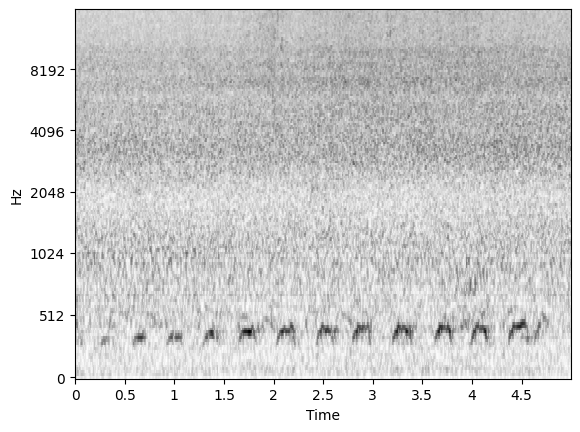

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_034025.WAV
offset_s     : 715.00
rank         : 10
score        : -9.27


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


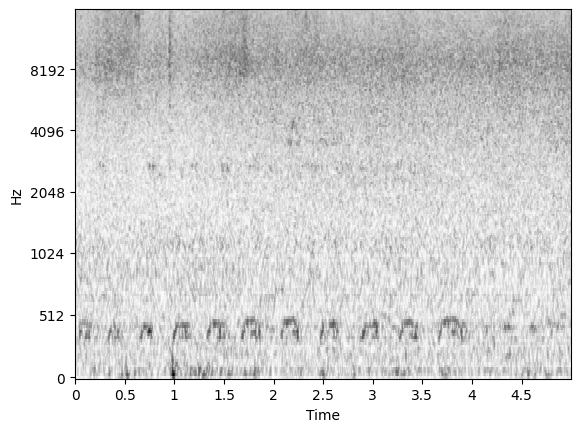

dataset name : intaka
source uri   : Intaka-6Feb-22Feb-2021/1-TreeBeforeNursery/20210207_040045.WAV
offset_s     : 690.00
rank         : 11
score        : -9.27


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


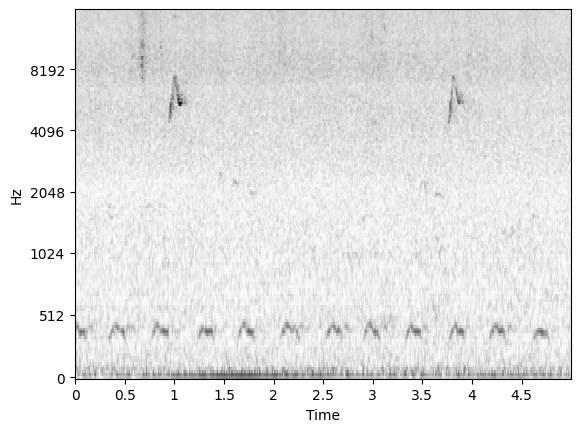

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20201231_092150.WAV
offset_s     : 1030.00
rank         : 12
score        : -9.28


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


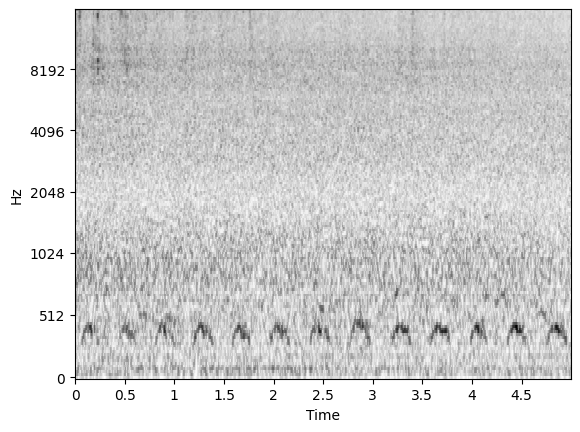

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_102205.WAV
offset_s     : 185.00
rank         : 13
score        : -9.28


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


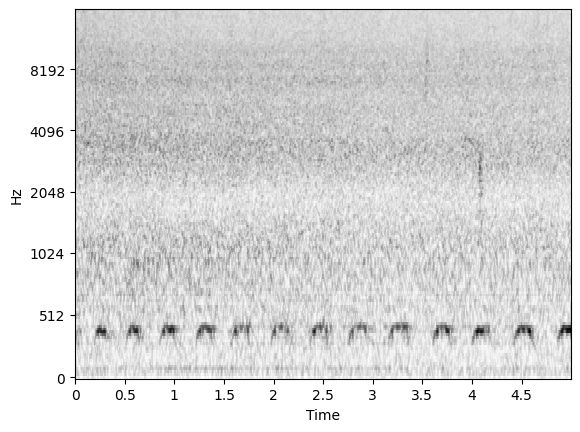

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_034025.WAV
offset_s     : 780.00
rank         : 14
score        : -9.29


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


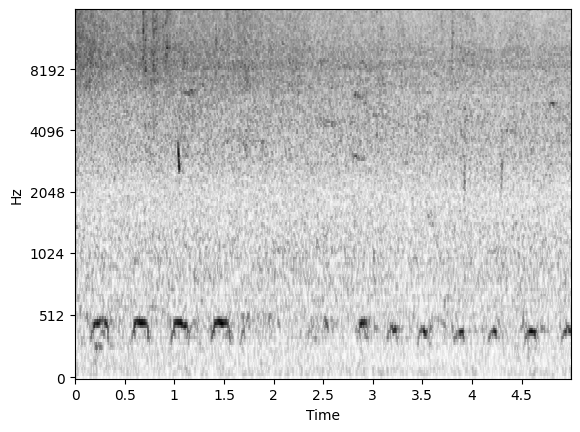

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_034025.WAV
offset_s     : 280.00
rank         : 15
score        : -9.30


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


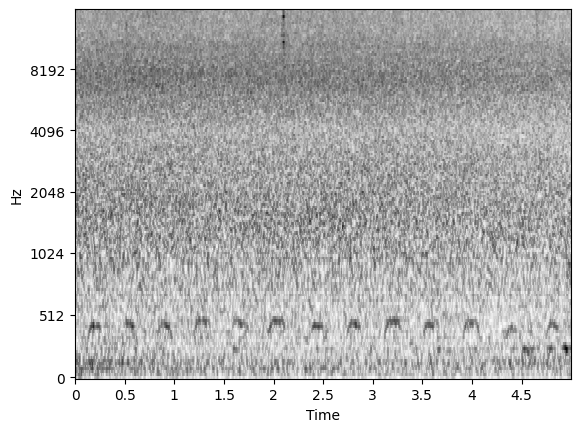

dataset name : intaka
source uri   : Intaka-10Jan-16Jan-2021/Floating_Island/20210110_122250.WAV
offset_s     : 405.00
rank         : 16
score        : -9.32


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


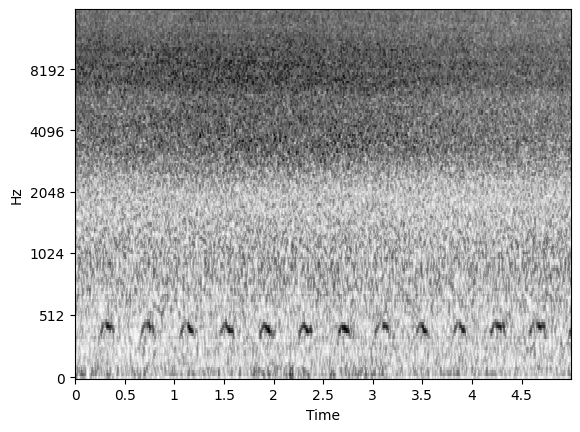

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_100200.WAV
offset_s     : 1080.00
rank         : 17
score        : -9.38


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


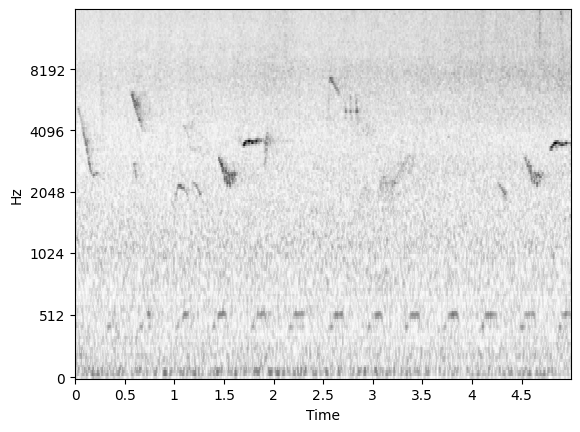

dataset name : intaka
source uri   : Intaka-10Jan-16Jan-2021/Floating_Island/20210115_050100.WAV
offset_s     : 45.00
rank         : 18
score        : -9.40


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------


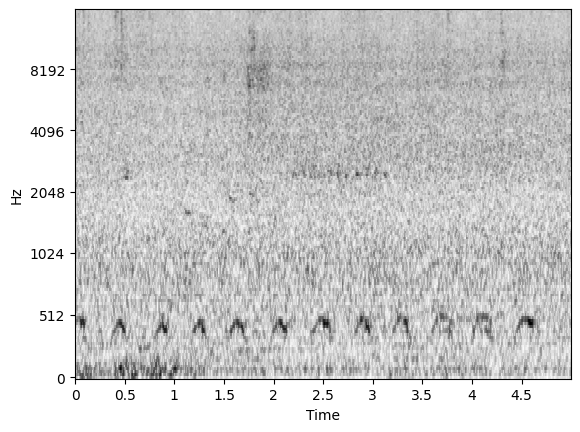

dataset name : intaka
source uri   : Intaka-31Dec-6Jan/1-Floating_Island/20210101_094155.WAV
offset_s     : 745.00
rank         : 19
score        : -9.40


GridspecLayout(children=(Button(description='speckled pigeon', layout=Layout(grid_area='widget001'), style=But…


--------------------------------------------------------------------------------
Page 2 of 6


Button(description='Prev Page', style=ButtonStyle())

Button(description='Next Page', style=ButtonStyle())

In [ ]:
#@title Display Results. { vertical-output: true }

display_results = embedding_display.EmbeddingDisplayGroup.from_search_results(
    results, db, sample_rate_hz=32000, frame_rate=100,
    audio_loader=audio_filepath_loader)
display_results.display(positive_labels=[query_label])

In [ ]:
#@title Save data labels. { vertical-output: true }

prev_lbls, new_lbls = 0, 0
for lbl in display_results.harvest_labels(annotator_id):
  check = db.insert_label(lbl, skip_duplicates=True)
  new_lbls += check
  prev_lbls += (1 - check)
print('\nnew_lbls: ', new_lbls)
print('\nprev_lbls: ', prev_lbls)


new_lbls:  20

prev_lbls:  0


In [ ]:
#@title Classifier training. { vertical-output: true }

#@markdown Set of labels to classify. If None, auto-populated from the DB.
target_labels = None  #@param

#@markdown Classifier traning hyperparams. These should not require tuning.
learning_rate = 1e-3  #@param
weak_neg_weight = 0.05  #@param
l2_mu = 0.000  #@param
num_steps = 128  #@param

train_ratio = 0.9  #@param
batch_size = 128  #@param
weak_negatives_batch_size = 128  #@param
loss_fn_name = 'bce'  #@param ['hinge', 'bce']

data_manager = classifier_data.AgileDataManager(
    target_labels=target_labels,
    db=db,
    train_ratio=train_ratio,
    min_eval_examples=1,
    batch_size=batch_size,
    weak_negatives_batch_size=weak_negatives_batch_size,
    rng=np.random.default_rng(seed=5))
print('Training for target labels : ')
print(data_manager.get_target_labels())
linear_classifier, eval_scores = classifier.train_linear_classifier(
    data_manager=data_manager,
    learning_rate=learning_rate,
    weak_neg_weight=weak_neg_weight,
    num_train_steps=num_steps,
)
print('\n' + '-' * 80)
top1 = eval_scores['top1_acc']
print(f'top-1      {top1:.3f}')
rocauc = eval_scores['roc_auc']
print(f'roc_auc    {rocauc:.3f}')
cmap = eval_scores['cmap']
print(f'cmap       {cmap:.3f}')

# Save linear classifier.
linear_classifier.save(os.path.join(db_path, 'agile_classifier_v2.pt'))

Training for target labels : 
('cape white-eye song', 'ring-necked dove', 'speckled pigeon')


Loss 0.03462226:  78%|███████▊  | 100/128 [00:06<00:01, 14.82it/s]


--------------------------------------------------------------------------------
top-1      0.800
roc_auc    1.000
cmap       1.000


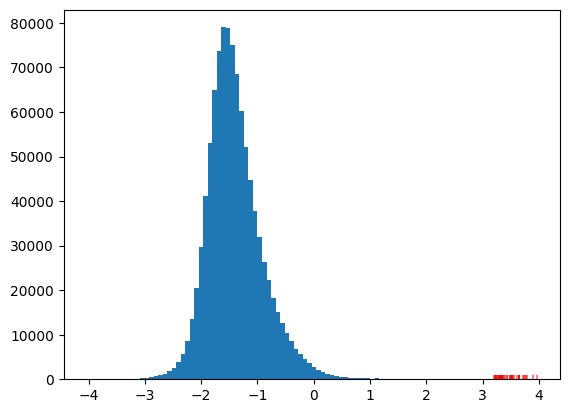

In [ ]:
#@title Review Classifier Results. { vertical-output: true }

#@markdown Number of results to find and display.
target_label = 'ring-necked dove'  #@param {type:'string'}
num_results = 50  #@param

target_label_idx = data_manager.get_target_labels().index(target_label)
class_query = linear_classifier.beta[:, target_label_idx]
bias = linear_classifier.beta_bias[target_label_idx]

#@markdown Number of (randomly selected) database entries to search over.
sample_size = 1_000_000  #@param

#@markdown Whether to use margin-sampling. If checked, search for examples
#@markdown with logits near a particular target score (usually 0).
margin_sampling = False  #@param {type: 'boolean'}

#@markdown When margin sampling, target this logit.
margin_target_score = -0.0  #@param
if not margin_sampling:
  margin_target_score = None
score_fn = score_functions.get_score_fn(
    'dot', bias=bias, target_score=margin_target_score)
results, all_scores = brutalism.threaded_brute_search(
    db, class_query, num_results, score_fn=score_fn,
    sample_size=sample_size)

# TODO(tomdenton): Better histogram when margin sampling.
_ = plt.hist(all_scores, bins=100)
hit_scores = [r.sort_score for r in results.search_results]
plt.scatter(hit_scores, np.zeros_like(hit_scores), marker='|',
            color='r', alpha=0.5)


**When you are done / at the end of our time, make a CSV with all of the segments you labeled, using the following code.**

Send the CSV to Maria.

In [ ]:
print(db.get_classes())

# Get all labeled examples
for cls in db.get_classes():
  idxes = db.get_embeddings_by_label(cls)
  for idx in idxes:
    s = db.get_embedding_source(idx)
    for lbl in db.get_labels(idx):
      print(f'{s.source_id}, {s.offsets[0]}, {lbl.label}, {lbl.type}')

('cape white-eye song', 'ring-necked dove', 'speckled pigeon')
Intaka-20Jan=/TreeNursery/20210126_054110.WAV, 970.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210102_030015.WAV, 610.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 385.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 425.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 570.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 580.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 650.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210103_030015.WAV, 970.0, cape white-eye song, LabelType.POSITIVE
Intaka-31Dec-6Jan/1-Floating_Island/20210104_030015.WAV, 455.0, cape white-eye song, LabelType.POSITIVE
Intaka-31De

In [ ]:
import pandas as pd

data = []

for cls in db.get_classes():
    idxes = db.get_embeddings_by_label(cls)
    for idx in idxes:
        s = db.get_embedding_source(idx)
        for lbl in db.get_labels(idx):
            # Append a dictionary to the list
            data.append({
                'source_id': s.source_id,
                'offset': s.offsets[0],
                'label': lbl.label,
                'type': lbl.type
            })

# Create a DataFrame and save
df = pd.DataFrame(data)
df.to_csv('output.csv', index=False)
print("CSV saved successfully.")

CSV saved successfully.
